In [2]:
!pip install scFates


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [3]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [4]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

In [11]:
adata = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D59_fetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D59_fetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [12]:
adata2 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D125Pfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)


... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D125Pfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [13]:
adata1 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D125Cfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D125Cfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [14]:
adata3 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D82Cfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D82Cfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [15]:
adata4 = sc.read_10x_mtx(r"/mnt/c/Users/Emil/10X/scretina/D82Pfetal_filtered_gene_bc_matrices/GRCh38/", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-scretina-D82Pfetal_filtered_gene_bc_matrices-GRCh38-matrix.h5ad


In [16]:
adata.obs['stage'] = 'FD59'

In [17]:
adata1.obs['stage'] = 'FD125'
adata2.obs['stage'] = 'FD125'
adata3.obs['stage'] = 'FD82'
adata4.obs['stage'] = 'FD82'

In [18]:
adataall.obs

NameError: name 'adataall' is not defined

In [19]:
adata.obs_names_make_unique()

In [20]:
adata.obs_names_make_unique()
adata1.obs_names_make_unique()
adata2.obs_names_make_unique()
adata3.obs_names_make_unique()
adata4.obs_names_make_unique()

In [21]:
adataall = AnnData.concatenate(adata, adata1, adata2, adata3, adata4)

In [22]:
adataall.obs

,stage,batch
AAACATACGAGGCA-1-0,FD59,0
AAACATACTTCCAT-1-0,FD59,0
AAACATACTTTCAC-1-0,FD59,0
AAACATTGACCTGA-1-0,FD59,0
AAACCGTGAGAACA-1-0,FD59,0
...,...,...
TTTAGGCTTGCCTC-1-4,FD82,4
TTTAGGCTTTGACG-1-4,FD82,4
TTTATCCTTGCTCC-1-4,FD82,4
TTTCAGTGGCTTAG-1-4,FD82,4


In [23]:
adata = adataall

In [24]:
sc.pp.filter_genes(adata,min_cells=1)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata,base=10)
sc.pp.highly_variable_genes(adata)

filtered out 9430 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:11)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [25]:
sc.pp.highly_variable_genes(adata, n_top_genes=1500, flavor='cell_ranger')
sc.pp.pca(adata)
pca_projections = pd.DataFrame(adata.obsm["X_pca"],index=adata.obs_names)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


In [26]:
pca_projections = pd.DataFrame(adata.obsm["X_pca"],index=adata.obs_names)

In [27]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)


In [28]:
# generate neighbor draph in multiscale diffusion space
adata.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adata,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [29]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adata.obsm["X_pca2d"]=adata.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adata,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:10:10)


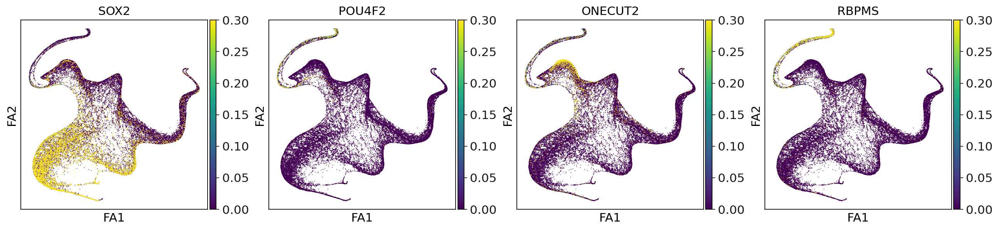

In [30]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=["SOX2",'POU4F2','ONECUT2','RBPMS'], vmax = 0.3)

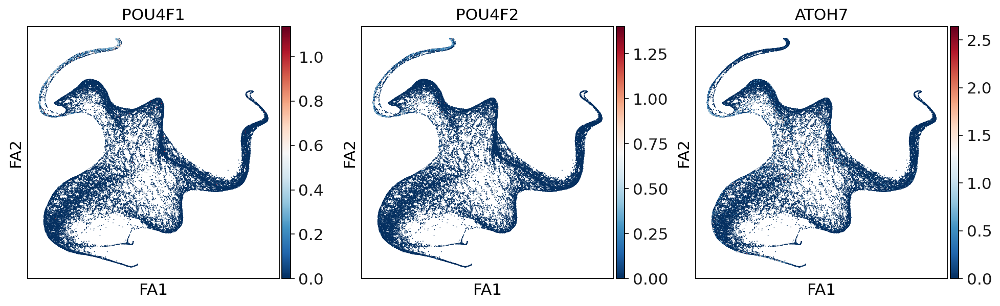

In [31]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['POU4F1','POU4F2','ATOH7'],color_map="RdBu_r")

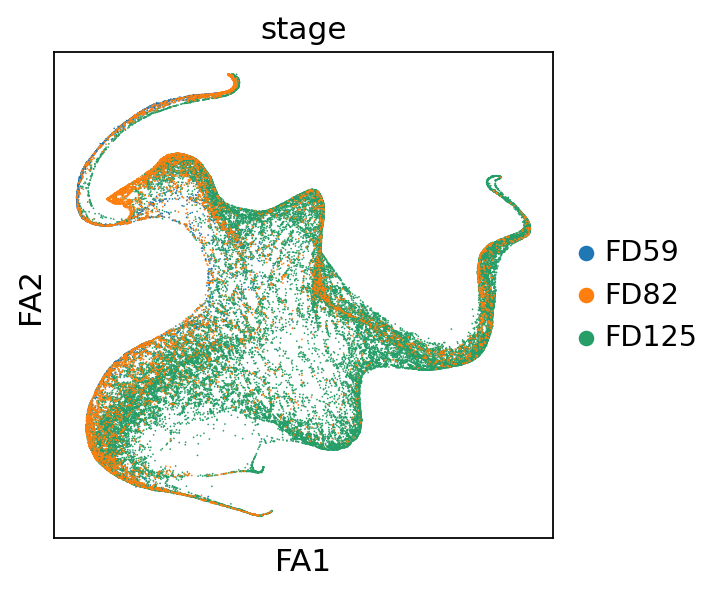

In [32]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=['stage'],color_map="RdBu_r")

In [42]:
sc.tl.leiden(adata, resolution = 1.6)

running Leiden clustering
    finished: found 64 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:22)


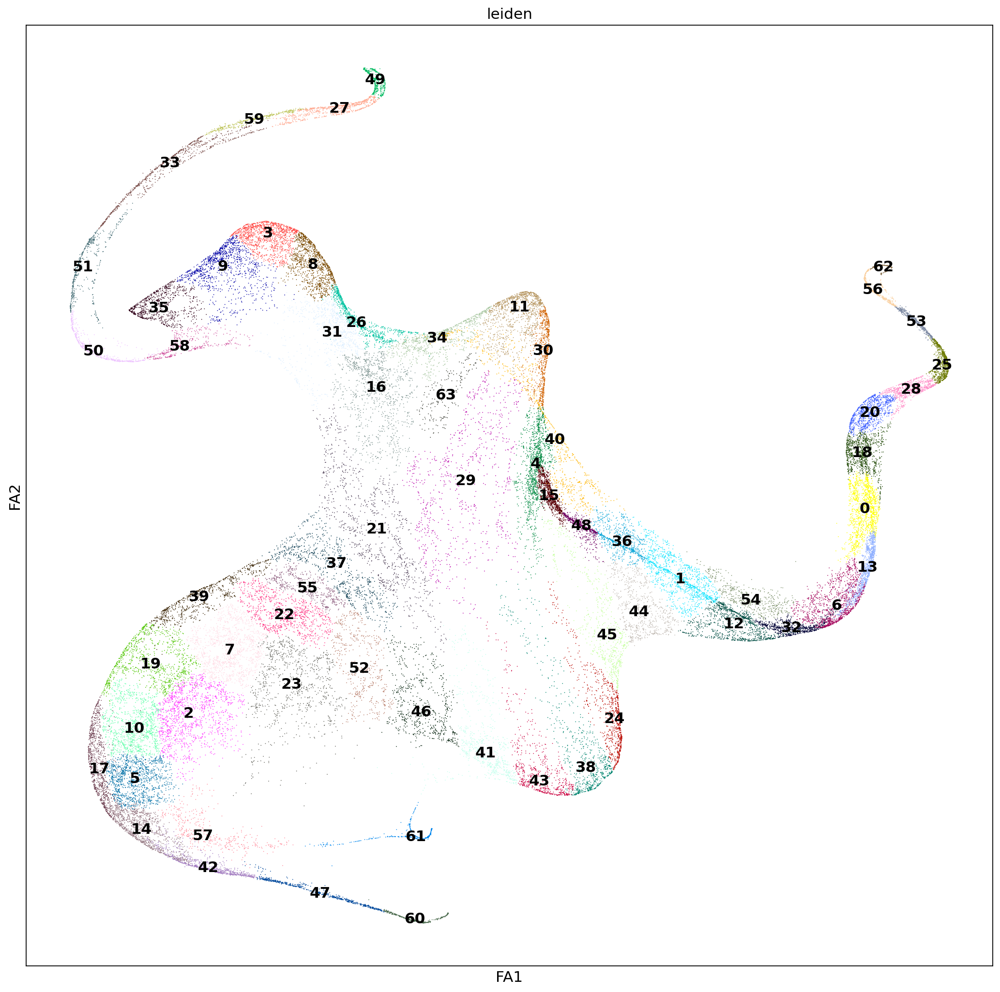

In [45]:
sc.set_figure_params(figsize = [16,16])
sc.pl.draw_graph(adata,color=["leiden"], legend_loc = 'on data')

In [51]:
adatasubset = adata[adata.obs['leiden'].isin(['49','27','33','59','51','50','58','35','9','3','8','26','31'])]

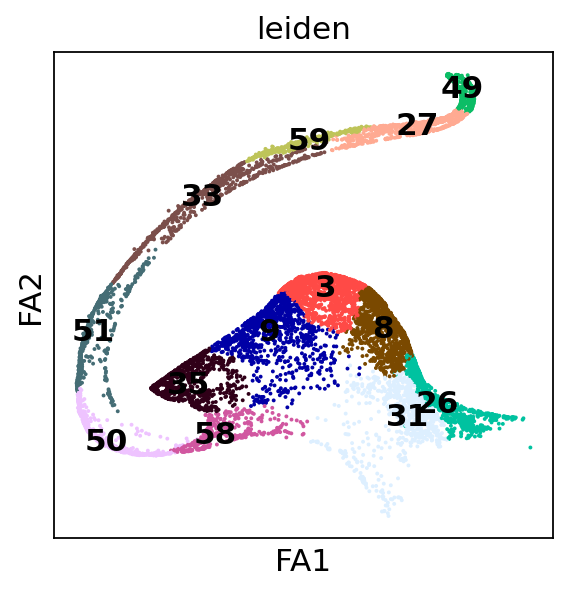

In [52]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=["leiden"], legend_loc = 'on data')

In [133]:
adatasubset.var

,gene_ids,stage-1,stage-2,stage-3,stage-4,n_cells,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.3,ENSG00000243485,FD125,FD125,FD82,FD82,1,False,0.000012,0.593960,1.344147
RP11-34P13.7,ENSG00000238009,FD125,FD125,FD82,FD82,12,False,0.000107,0.621599,0.242403
RP11-34P13.8,ENSG00000239945,FD125,FD125,FD82,FD82,1,True,0.000017,0.866658,2.807348
FO538757.2,ENSG00000279457,FD125,FD125,FD82,FD82,1428,False,0.013719,0.614714,-1.106546
AP006222.2,ENSG00000228463,FD125,FD125,FD82,FD82,880,False,0.008033,0.608885,-1.019663
...,...,...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,FD125,FD125,FD82,FD82,191,False,0.001455,0.531235,-1.677975
AC007325.2,ENSG00000277196,FD125,FD125,FD82,FD82,1,False,0.000008,0.411492,0.365092
AL354822.1,ENSG00000278384,FD125,FD125,FD82,FD82,11,False,0.000111,0.575987,-0.173916
AC004556.1,ENSG00000276345,FD125,FD125,FD82,FD82,4,False,0.000038,0.571934,0.054530


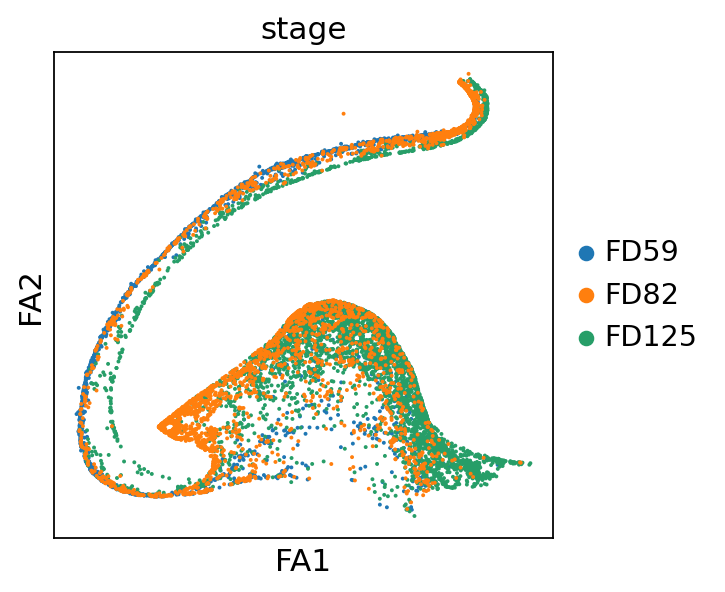

In [135]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=['stage'],color_map="RdBu_r")

In [136]:
adatasubset_subFD59 = adatasubset[adatasubset.obs['stage'].isin(['FD59']),]

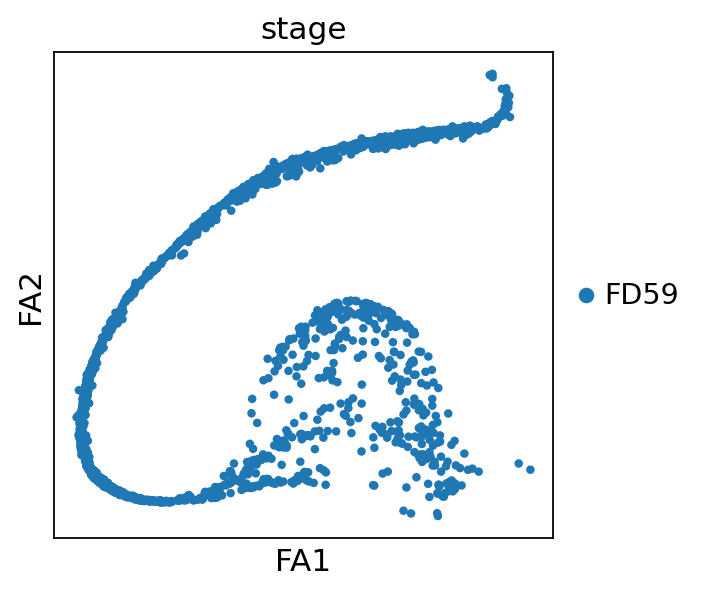

In [137]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset_subFD59,color=['stage'],color_map="RdBu_r")

In [138]:
adatasubset_subFD82 = adatasubset[adatasubset.obs['stage'].isin(['FD82']),]

In [139]:
adatasubset_subFD125 = adatasubset[adatasubset.obs['stage'].isin(['FD125']),]

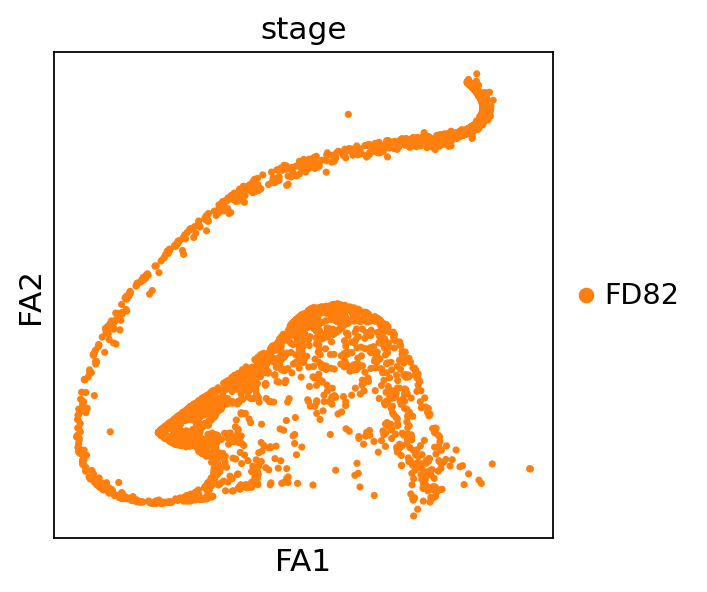

In [147]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset_subFD82,color=['stage'])

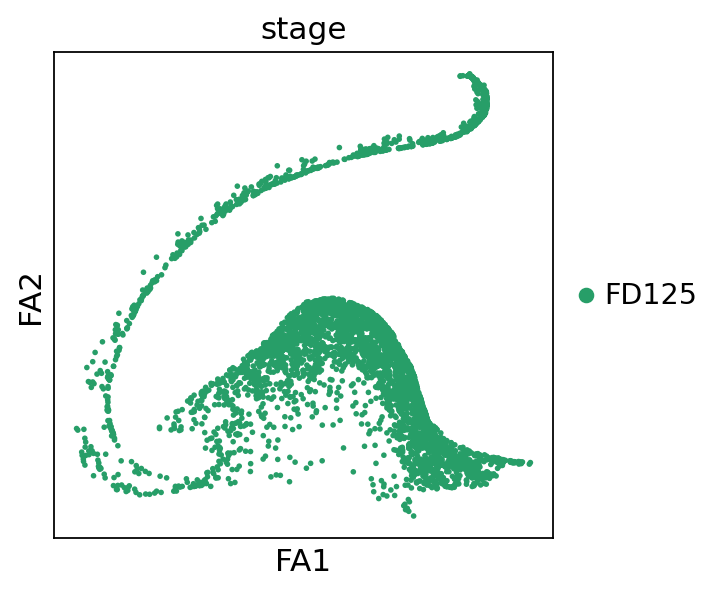

In [148]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset_subFD125,color=['stage'])

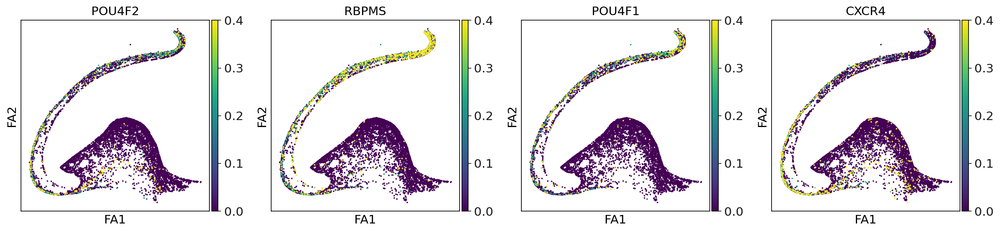

In [202]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=['POU4F2','RBPMS','POU4F1','CXCR4'], vmax = 0.4)

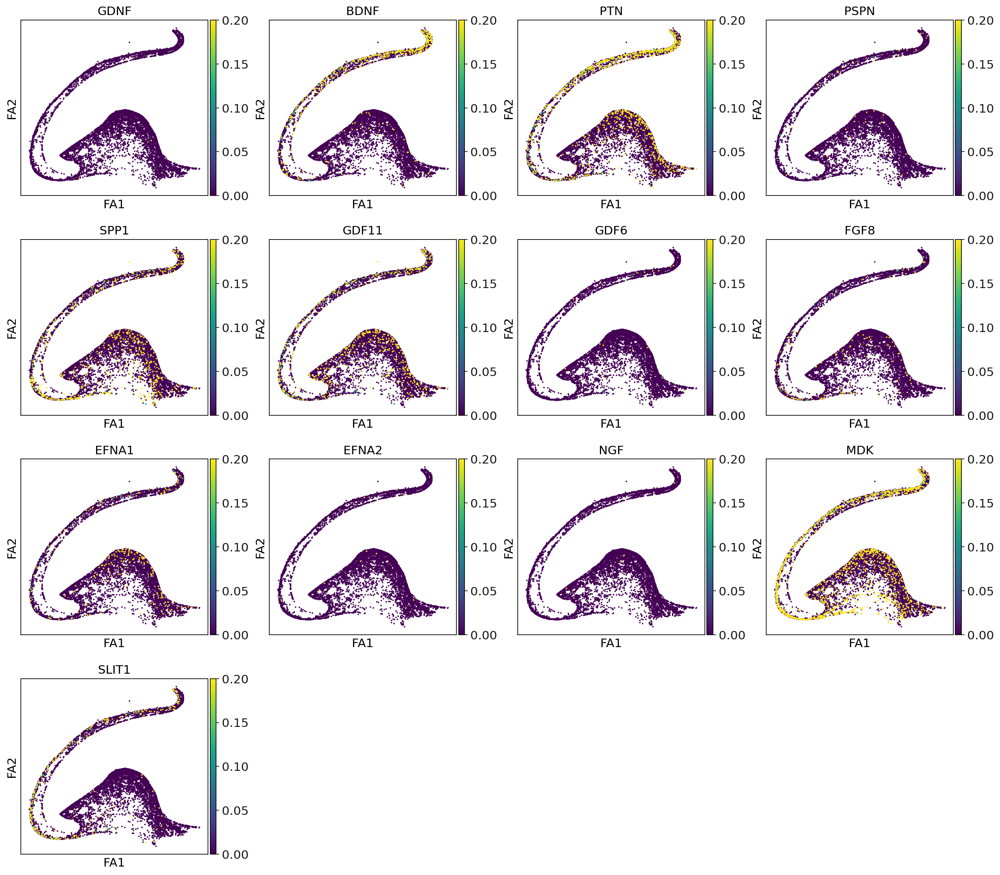

In [153]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=['GDNF','BDNF','PTN','PSPN','SPP1','GDF11','GDF6','FGF8','EFNA1','EFNA2','NGF','MDK','SLIT1'], vmax = 0.2)

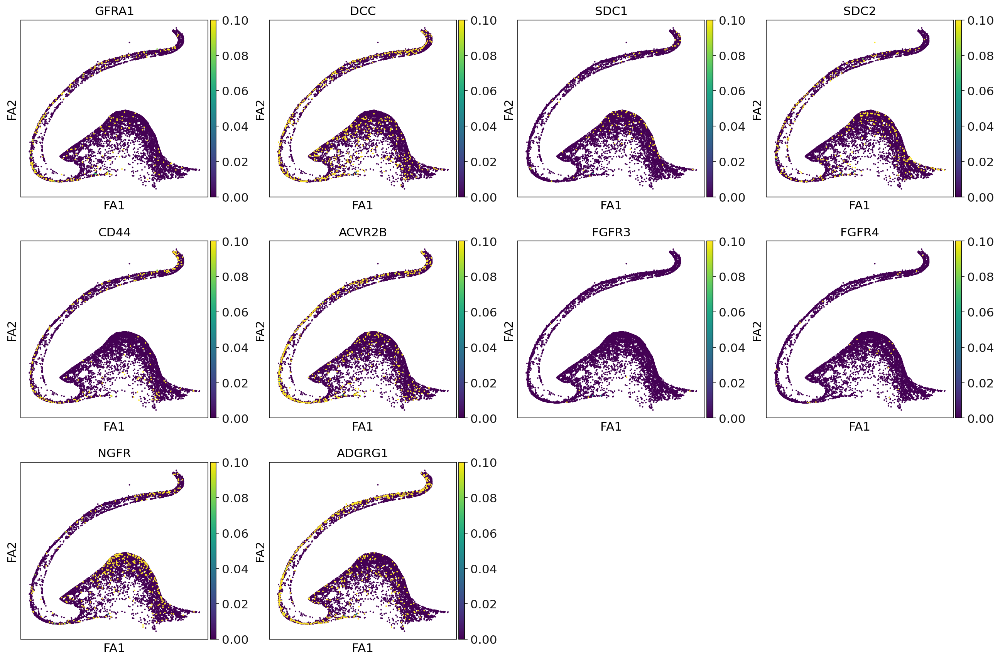

In [157]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=['GFRA1','DCC','SDC1','SDC2','CD44','ACVR2B','FGFR3','FGFR4','NGFR','ADGRG1'], vmax = 0.1)

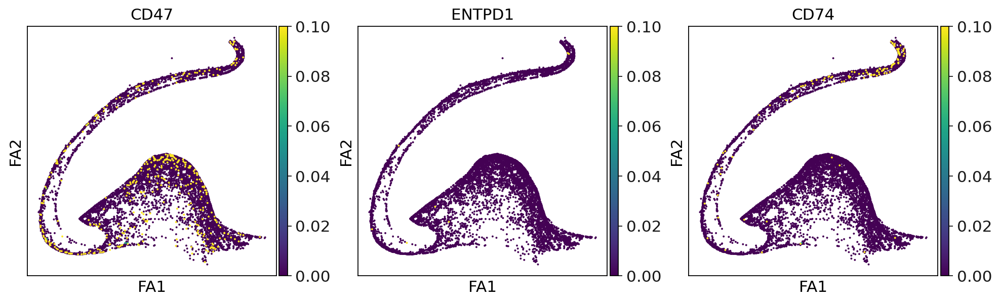

In [159]:
sc.set_figure_params()
sc.pl.draw_graph(adatasubset,color=['CD47','ENTPD1','CD74'], vmax = 0.1)

In [128]:
from platform import python_version

print(python_version())

3.7.0


In [129]:
pip show scFates

Name: scFates
Version: 0.9.0
Summary: scanpy compatible python suite for fast tree inference and advanced pseudotime downstream analysis
Home-page: https://github.com/LouisFaure/scFates
Author: Louis Faure
Author-email: 
License: UNKNOWN
Location: /home/mcrewcow/anaconda3/lib/python3.7/site-packages
Requires: matplotlib, scikit-misc, elpigraph-python, igraph, scikit-learn, networkx, cycler, scanpy, joblib, numpy, anndata, adjustText, python-igraph, tqdm, typing-extensions, plotly, statsmodels, pandas, leidenalg, seaborn, simpleppt, scipy, numba
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [130]:
pip show scanpy

Name: scanpy
Version: 1.9.1
Summary: Single-Cell Analysis in Python.
Home-page: 
Author: Alex Wolf, Philipp Angerer, Fidel Ramirez, Isaac Virshup, Sergei Rybakov, Gokcen Eraslan, Tom White, Malte Luecken, Davide Cittaro, Tobias Callies, Marius Lange, Andrés R. Muñoz-Rojas
Author-email: 
License: 
Location: /home/mcrewcow/anaconda3/lib/python3.7/site-packages
Requires: statsmodels, matplotlib, seaborn, tqdm, pandas, umap-learn, numba, importlib_metadata, packaging, scipy, joblib, patsy, session-info, natsort, scikit-learn, anndata, numpy, networkx, h5py
Required-by: scvelo, scFates, palantir, cellrank
Note: you may need to restart the kernel to use updated packages.


In [176]:
import anndata2ri
anndata2ri.activate()

In [160]:
%load_ext rpy2.ipython

In [60]:
adatasubset = sc.read_h5ad('/mnt/c/Users/Emil/10X/scretina/adatasubset.h5ad')

In [201]:
AnnData.write_h5ad(adatasubset, '/mnt/c/Users/Emil/10X/scretina/adatasubset.h5ad')




In [193]:
adatasubset.raw = adatasubset

In [195]:
adatasubset.raw

In [170]:
adatasubset.raw

In [180]:
obs = adatasubset.obs
var = adatasubset.raw.var
uns = adatasubset.uns
raw = adatasubset.raw

In [189]:
adatasubset_raw = anndata.AnnData(obs=obs, var=var, uns=uns, raw=raw)

In [190]:
adatasubset_raw

AnnData object with n_obs × n_vars = 9652 × 24264
    obs: 'stage', 'batch', 'leiden'
    var: 'gene_ids', 'stage-1', 'stage-2', 'stage-3', 'stage-4', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'leiden', 'leiden_colors', 'stage_colors'

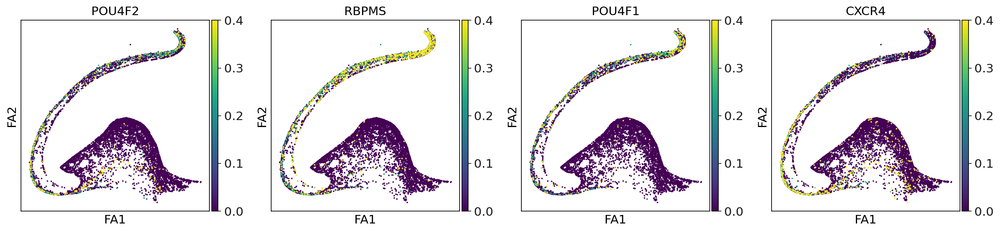

In [203]:
sc.pl.draw_graph(adatasubset,color=['POU4F2','RBPMS','POU4F1','CXCR4'], vmax = 0.4)

In [221]:
sc.tl.score_genes(adatasubset_subFD125, gene_list = ['ACAP3','ADGRG1','ADGRL3','ALKBH1','ARHGEF2','ARX','ASCL1','ASPM',
                                            'ASTN1','ASTN2','ATOH1','AUTS2','AXL','BARHL1','BARHL2','BAX','BBS1',
'BBS4','CAMK2A','CAMK2B','CCK','CCKAR','CCR4','CDK5','CDK5R1','CDK5R2','CDKL5','CELSR1','CELSR2','CEP85L','CHL1',
'CNTN2','COL3A1','CRK','CRKL','CTNNA2','CTNNB1','CX3CL1','CXCL12','CXCR4','DAB1','DAB2IP','DCC','DCDC2','DCLK1','DCX',
'DDIT4','DISC1','DNAAF4','DNER','DRD1','DRD2','DRGX','ELP3','EMX2','EOMES','EVX1','FAT3','FBXO31','FBXO45','FEZF1',
'FEZF2','FGF13','FGFR1','FLRT2','FOXG1','FYN','FZD3','GAS6','GATA2','GATA3','GFRA3','GNRH1','GPM6A','GPR173',
'HSP90AA1','IGSF10','ITGA3','KIAA0319','KIAA0319L','KIF20B','KIRREL3','LHX1','LHX6','LRIG2','LRP12','MAP1B',
'MARK1','MARK2','MDGA1','MDK','MEF2C','NAV1','NDE1','NDEL1','NDN','NDNF','NEO1','NEUROD4','NEXMIF','NIPBL',
'NKX2-1','NKX6-1','NR2F2','NR4A2','NRCAM','NRG1','NRG3','NRP1','NRP2','NSMF','NTN1','NTNG1','NTNG2','NTRK2','NTRK3',
'OLIG3','PAFAH1B1','PAX6','PCM1','PEX13','PEX5','PEX7','PHACTR1','PHOX2B','PLAA','PLXNA1','PLXNA3','PLXNB2','POMGNT2',
'POU4F1','PRKG1','PSEN1','RAC1','RAPGEF2','RELN','RHOA','SATB2','SCRT1','SCRT2','SDCCAG8','SEMA3A','SEMA3E',
'SEMA6A','SEPTIN14','SEPTIN4','SH3RF1','SHTN1','SOX1','SOX14','SPOCK1','SRF','SRGAP2','SRGAP2C','STAT3','TBC1D24',
'TBX20','TLX3','TNN','TOP2B','TRIM46','TUBB2A','TUBB2B','TUBGCP2','TWIST1','TYRO3','ULK4','UNC5C','UNC5D','UNK',
                                        'USP9X','VAX1','VEGFA','WDR62','YWHAE','ZMIZ1','ZNF609'])

computing score 'score'
    finished: added
    'score', score of gene set (adata.obs).
    991 total control genes are used. (0:00:00)


In [237]:
sc.tl.score_genes(adatasubset, gene_list = ['CDK5','DCX','NEUROD1','RAC1','STK25'], score_name = 'MP')

computing score 'MP'
    finished: added
    'MP', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)


In [281]:
sc.tl.score_genes(adatasubset, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609'], score_name = 'Jon_positive')

computing score 'Jon_positive'
    finished: added
    'Jon_positive', score of gene set (adata.obs).
    599 total control genes are used. (0:00:01)


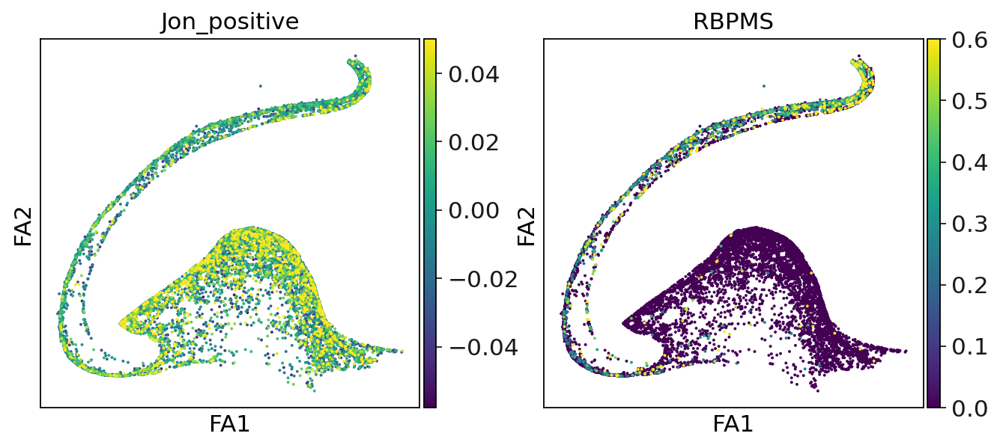

In [285]:
sc.pl.draw_graph(adatasubset,color=['Jon_positive','RBPMS'], vmax = [0.05,0.6])

In [286]:
sc.tl.score_genes(adatasubset, gene_list = ['ADGRG1','COL3A1','DRD2','ERBB4','GRNH1','GPR173','GSK3B',
                                           'NEXMIF','NRG1','NRG3','STAT3','TNN'], score_name = 'Jon_negative')

computing score 'Jon_negative'
    finished: added
    'Jon_negative', score of gene set (adata.obs).
    350 total control genes are used. (0:00:00)


In [304]:
sc.tl.score_genes(adatasubset, gene_list = ['ADAM17','CAMK2A','CAMK2B','CDH1','CTNNA2','CXCR4','FLRT2',
                                           'IGSF10','LRIG2','NKX6-1','NSMF','NTNG1','NTNG2','PHACTR1','PLXNB2','RAC1',
                                           'SCRT1','SCRT2','SOX14','ULK4','UNC5C','UNC5D','ZSWIM6'], score_name = 'Jon_reg1')

computing score 'Jon_reg1'
    finished: added
    'Jon_reg1', score of gene set (adata.obs).
    548 total control genes are used. (0:00:00)


In [292]:
sc.tl.score_genes(adatasubset, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ARX','CCR4','CNTN2','EVX1','FAT3','FEZF2','LHX6','NKX2-1','NR2F1','NR2F2',
                                           'PAFAH1B1','RAC1','SOX1'], score_name = 'Jon_pos_reg2')

computing score 'Jon_pos_reg2'
    finished: added
    'Jon_pos_reg2', score of gene set (adata.obs).
    648 total control genes are used. (0:00:00)


In [293]:
sc.tl.score_genes(adatasubset_subFD59, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609'], score_name = 'Jon_positive')
sc.tl.score_genes(adatasubset_subFD82, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609'], score_name = 'Jon_positive')
sc.tl.score_genes(adatasubset_subFD125, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609'], score_name = 'Jon_positive')

sc.tl.score_genes(adatasubset_subFD59, gene_list = ['ADGRG1','COL3A1','DRD2','ERBB4','GRNH1','GPR173','GSK3B',
                                           'NEXMIF','NRG1','NRG3','STAT3','TNN'], score_name = 'Jon_negative')
sc.tl.score_genes(adatasubset_subFD82, gene_list = ['ADGRG1','COL3A1','DRD2','ERBB4','GRNH1','GPR173','GSK3B',
                                           'NEXMIF','NRG1','NRG3','STAT3','TNN'], score_name = 'Jon_negative')
sc.tl.score_genes(adatasubset_subFD125, gene_list = ['ADGRG1','COL3A1','DRD2','ERBB4','GRNH1','GPR173','GSK3B',
                                           'NEXMIF','NRG1','NRG3','STAT3','TNN'], score_name = 'Jon_negative')

sc.tl.score_genes(adatasubset_subFD59, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ADAM17','CAMK2A','CAMK2B','CDH1','CTNNA2','CXCR4','FLRT2',
                                           'IGSF10','LRIG2','NKX6-1','NSMF','NTNG1','NTNG2','PHACTR1','PLXNB2','RAC1',
                                           'SCRT1','SCRT2','SOX14','ULK4','UNC5C','UNC5D','ZSWIM6'], score_name = 'Jon_pos_reg1')
sc.tl.score_genes(adatasubset_subFD82, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ADAM17','CAMK2A','CAMK2B','CDH1','CTNNA2','CXCR4','FLRT2',
                                           'IGSF10','LRIG2','NKX6-1','NSMF','NTNG1','NTNG2','PHACTR1','PLXNB2','RAC1',
                                           'SCRT1','SCRT2','SOX14','ULK4','UNC5C','UNC5D','ZSWIM6'], score_name = 'Jon_pos_reg1')
sc.tl.score_genes(adatasubset_subFD125, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ADAM17','CAMK2A','CAMK2B','CDH1','CTNNA2','CXCR4','FLRT2',
                                           'IGSF10','LRIG2','NKX6-1','NSMF','NTNG1','NTNG2','PHACTR1','PLXNB2','RAC1',
                                           'SCRT1','SCRT2','SOX14','ULK4','UNC5C','UNC5D','ZSWIM6'], score_name = 'Jon_pos_reg1')

sc.tl.score_genes(adatasubset_subFD59, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ARX','CCR4','CNTN2','EVX1','FAT3','FEZF2','LHX6','NKX2-1','NR2F1','NR2F2',
                                           'PAFAH1B1','RAC1','SOX1'], score_name = 'Jon_pos_reg2')
sc.tl.score_genes(adatasubset_subFD82, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ARX','CCR4','CNTN2','EVX1','FAT3','FEZF2','LHX6','NKX2-1','NR2F1','NR2F2',
                                           'PAFAH1B1','RAC1','SOX1'], score_name = 'Jon_pos_reg2')
sc.tl.score_genes(adatasubset_subFD125, gene_list = ['ARHGAP32','ARHGEF2','DAB2IP','DRD1','FBXO31','FLNA','IL1R1','KIF20B',
                                           'MAPK8','MAPK8IP3','MDK','NIBPL','NSMF','PAX6','PLAA','PTPRZ1',
                                           'RAPGEF2','RELN','SEMA3A','SEMA6A','SHTN1','TBC1D24','WDR62',
                                           'ZFP609','ARX','CCR4','CNTN2','EVX1','FAT3','FEZF2','LHX6','NKX2-1','NR2F1','NR2F2',
                                           'PAFAH1B1','RAC1','SOX1'], score_name = 'Jon_pos_reg2')

computing score 'Jon_positive'
    finished: added
    'Jon_positive', score of gene set (adata.obs).
    599 total control genes are used. (0:00:00)
computing score 'Jon_positive'
    finished: added
    'Jon_positive', score of gene set (adata.obs).
    550 total control genes are used. (0:00:00)
computing score 'Jon_positive'
    finished: added
    'Jon_positive', score of gene set (adata.obs).
    649 total control genes are used. (0:00:00)
computing score 'Jon_negative'
    finished: added
    'Jon_negative', score of gene set (adata.obs).
    350 total control genes are used. (0:00:00)
computing score 'Jon_negative'
    finished: added
    'Jon_negative', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)
computing score 'Jon_negative'
    finished: added
    'Jon_negative', score of gene set (adata.obs).
    349 total control genes are used. (0:00:00)
computing score 'Jon_pos_reg1'
    finished: added
    'Jon_pos_reg1', score of gene set (adata.obs)

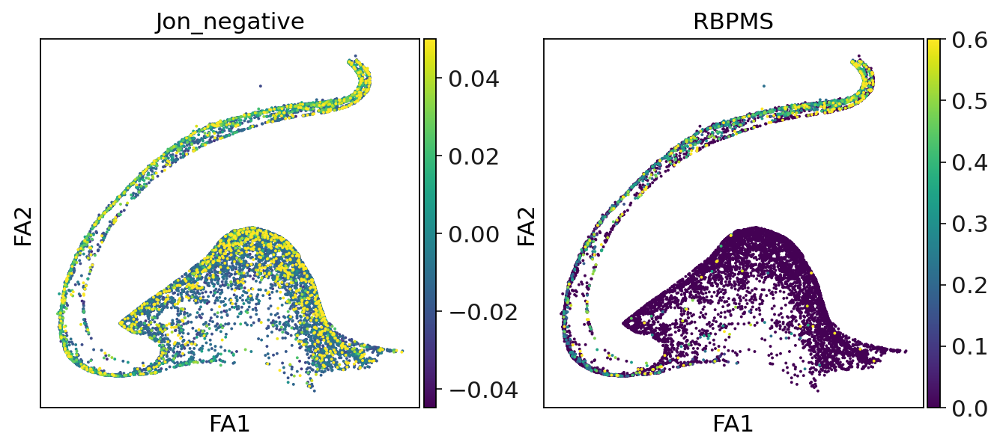

In [289]:
sc.pl.draw_graph(adatasubset,color=['Jon_negative','RBPMS'], vmax = [0.05,0.6])

In [278]:
sc.tl.score_genes(adata, gene_list = ['CDK5','DCX','NEUROD1','RAC1','STK25','ADGRG1','ARF6','CFL1','NCK2','RNF7'], score_name = 'Total_score')

computing score 'Total_score'
    finished: added
    'Total_score', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)


In [239]:
sc.tl.score_genes(adatasubset, gene_list = ['ADGRG1','ARF6','CFL1','NCK2','RNF7'], score_name = 'ST')

computing score 'ST'
    finished: added
    'ST', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)


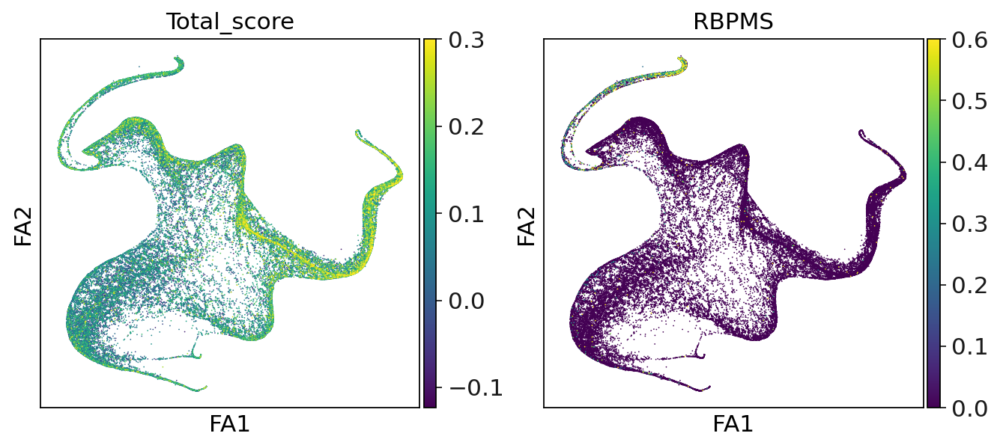

In [280]:
sc.pl.draw_graph(adata,color=['Total_score','RBPMS'], vmax = [0.3,0.6])

In [205]:
adatasubset

AnnData object with n_obs × n_vars = 9652 × 24264
    obs: 'stage', 'batch', 'leiden', 'score'
    var: 'gene_ids', 'stage-1', 'stage-2', 'stage-3', 'stage-4', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'leiden', 'leiden_colors', 'stage_colors'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

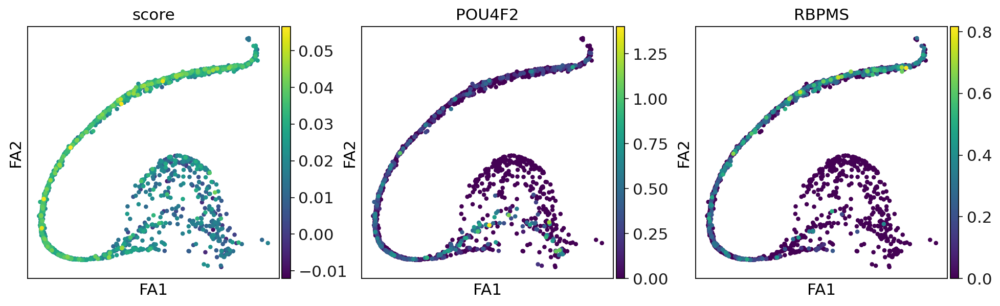

In [231]:
sc.pl.draw_graph(adatasubset_subFD59,color=['score','POU4F2','RBPMS'])

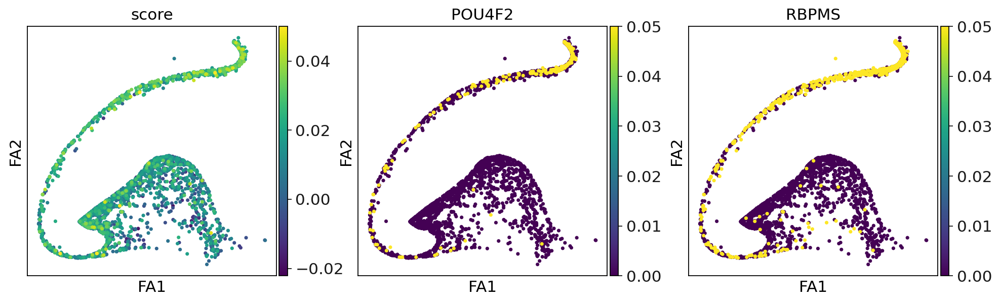

In [229]:
sc.pl.draw_graph(adatasubset_subFD82,color=['score','POU4F2','RBPMS'], vmax = 0.05)

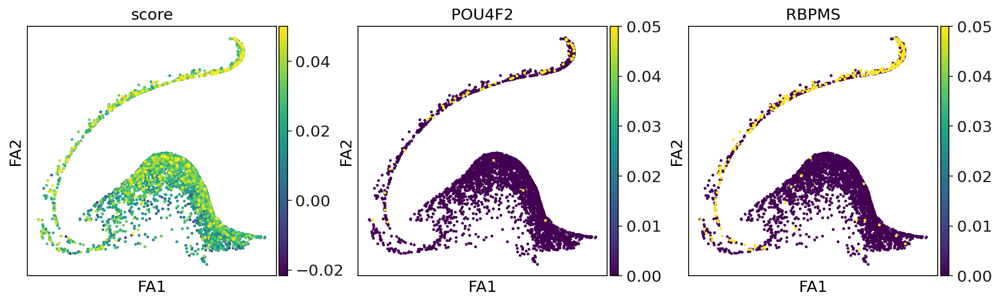

In [230]:
sc.pl.draw_graph(adatasubset_subFD125,color=['score','POU4F2','RBPMS'], vmax = 0.05)

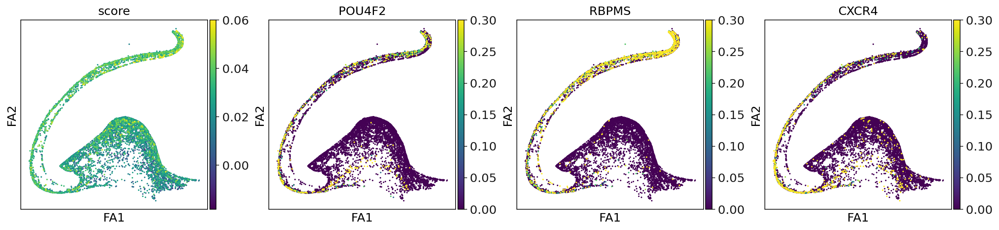

In [385]:
sc.pl.draw_graph(adatasubset,color=['score','POU4F2','RBPMS','CXCR4'], vmax = [0.06, 0.3, 0.3,0.3], title = None)

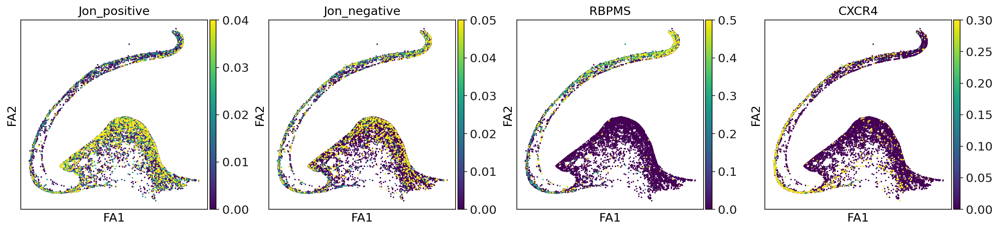

In [392]:
sc.set_figure_params()
scf.set_figure_pubready()
sc.pl.draw_graph(adatasubset,color=['Jon_positive','Jon_negative','RBPMS','CXCR4'],
                 vmax = [0.04, 0.05, 0.5,0.3], vmin = [0,0,0,0])

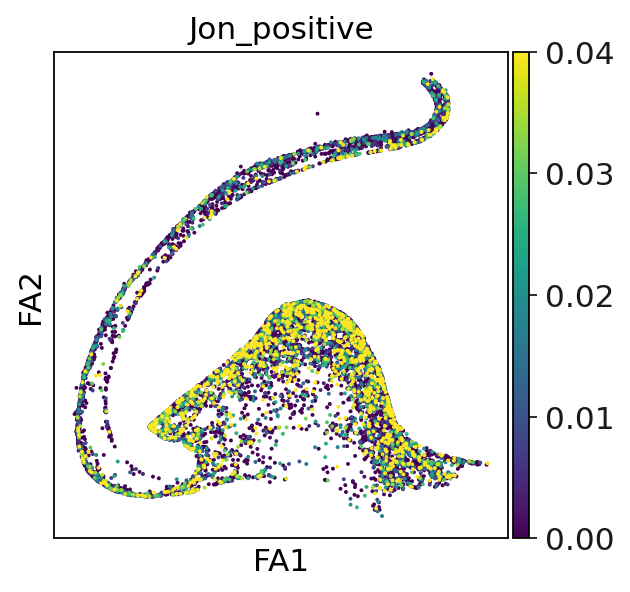

In [393]:
sc.set_figure_params()
scf.set_figure_pubready()
sc.pl.draw_graph(adatasubset,color=['Jon_positive'],
                 vmax = [0.04], vmin = [0])

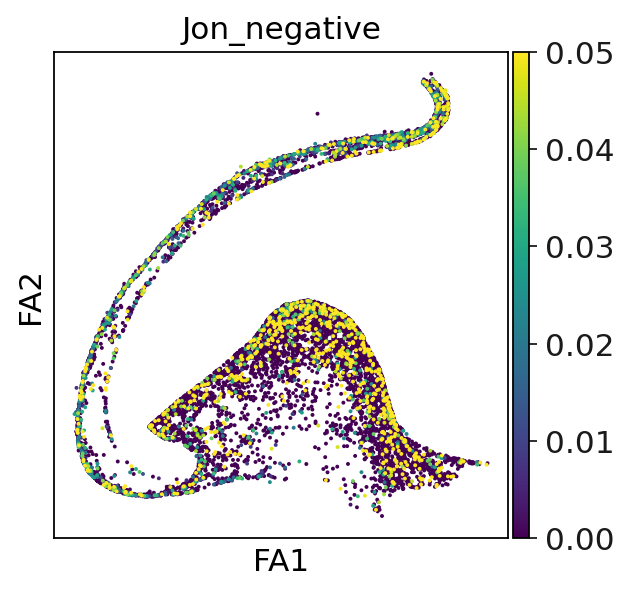

In [394]:
sc.set_figure_params()
scf.set_figure_pubready()
sc.pl.draw_graph(adatasubset,color=['Jon_negative'],
                 vmax = [0.05], vmin = [0])

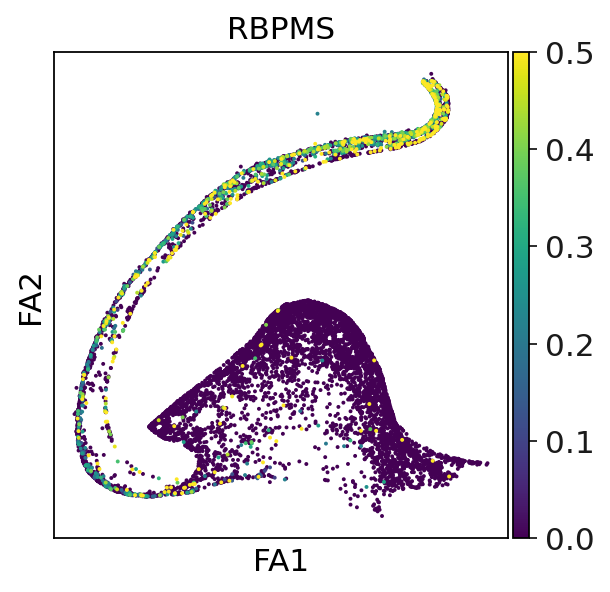

In [61]:
sc.set_figure_params()
scf.set_figure_pubready()
sc.pl.draw_graph(adatasubset,color=['RBPMS'],
                 vmax = [0.5], vmin = [0])

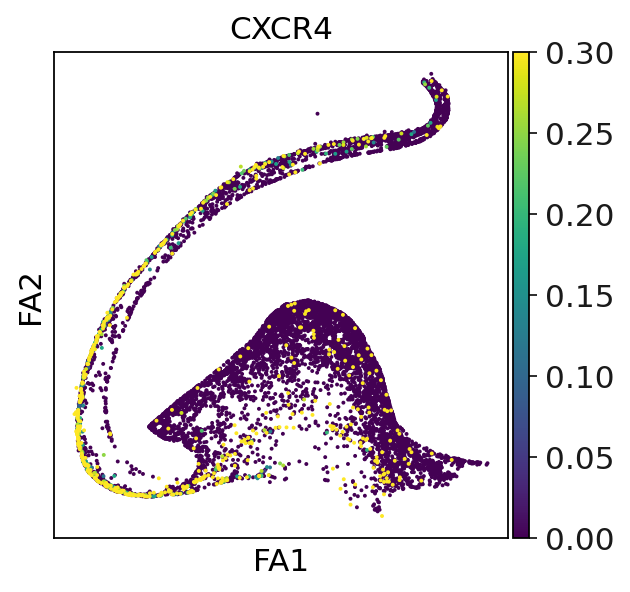

In [396]:
sc.set_figure_params()
scf.set_figure_pubready()
sc.pl.draw_graph(adatasubset,color=['CXCR4'],
                 vmax = [0.3], vmin = [0])

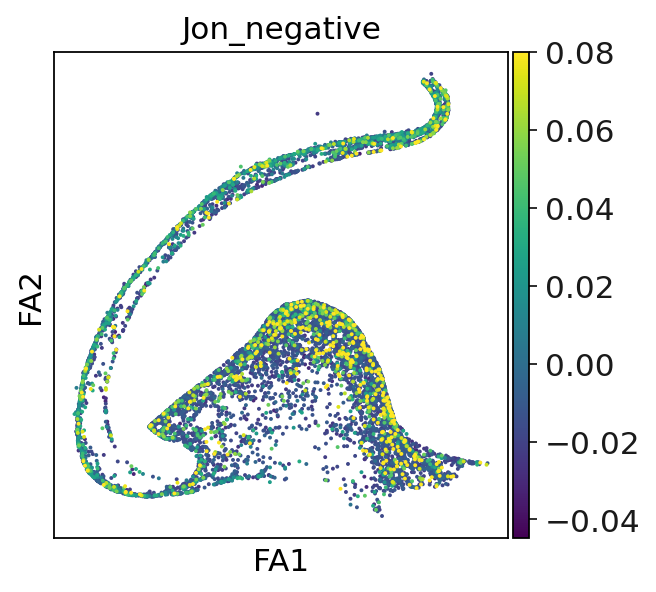

In [381]:
sc.set_figure_params()
scf.set_figure_pubready()
sc.pl.draw_graph(adatasubset,color=['Jon_negative'],
                 vmax = [0.08])

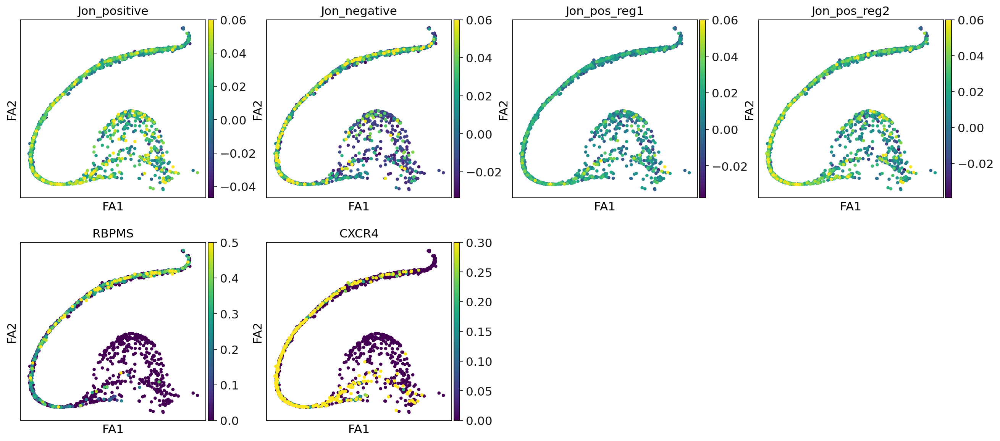

In [297]:
sc.pl.draw_graph(adatasubset_subFD59,color=['Jon_positive','Jon_negative','Jon_pos_reg1','Jon_pos_reg2','RBPMS','CXCR4'],
                 vmax = [0.06, 0.06, 0.06, 0.06, 0.5,0.3])

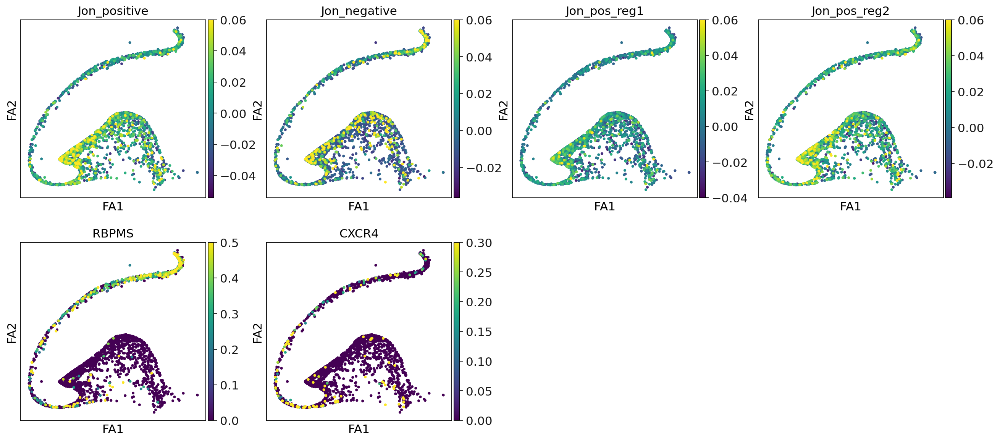

In [298]:
sc.pl.draw_graph(adatasubset_subFD82,color=['Jon_positive','Jon_negative','Jon_pos_reg1','Jon_pos_reg2','RBPMS','CXCR4'],
                 vmax = [0.06, 0.06, 0.06, 0.06, 0.5,0.3])

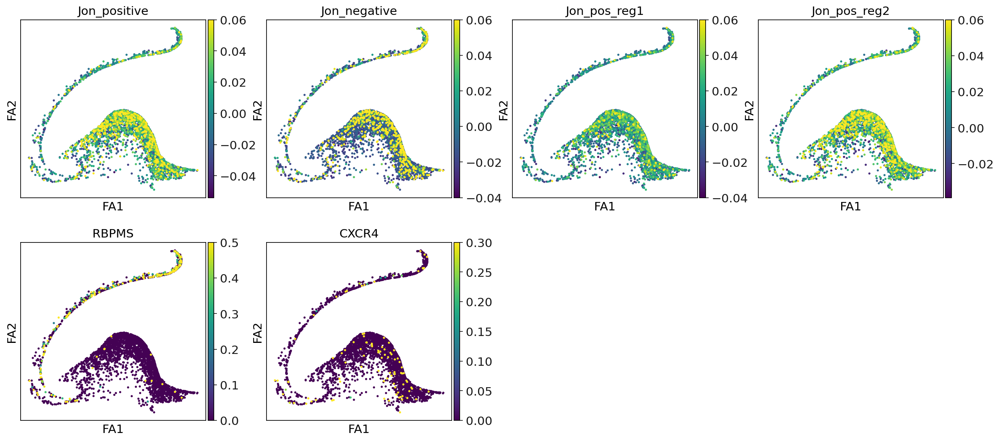

In [299]:
sc.pl.draw_graph(adatasubset_subFD125,color=['Jon_positive','Jon_negative','Jon_pos_reg1','Jon_pos_reg2','RBPMS','CXCR4'],
                 vmax = [0.06, 0.06, 0.06, 0.06, 0.5,0.3])

In [53]:
scf.tl.tree(adatasubset,method="ppt",Nodes=200,use_rep="palantir",
            device="cpu",seed=1,ppt_lambda=100,ppt_sigma=0.025,ppt_nsteps=100)

inferring a principal tree --> parameters used 
    200 principal points, sigma = 0.025, lambda = 100, metric = euclidean
    fitting:  33%|██████████████████████▊                                              | 33/100 [00:07<00:15,  4.40it/s]
    converged
    finished (0:00:07) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


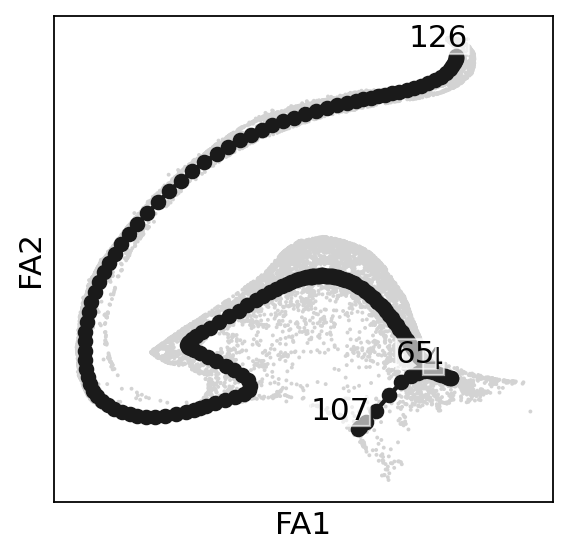

In [54]:
scf.pl.graph(adatasubset)

In [55]:
scf.tl.root(adatasubset,65)

node 65 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [56]:
scf.tl.pseudotime(adatasubset,n_jobs=20,n_map=100,seed=42)

projecting cells onto the principal graph
    mappings:  40%|███████████████████████████▏                                        | 40/100 [01:00<01:31,  1.52s/it]


KeyboardInterrupt: 

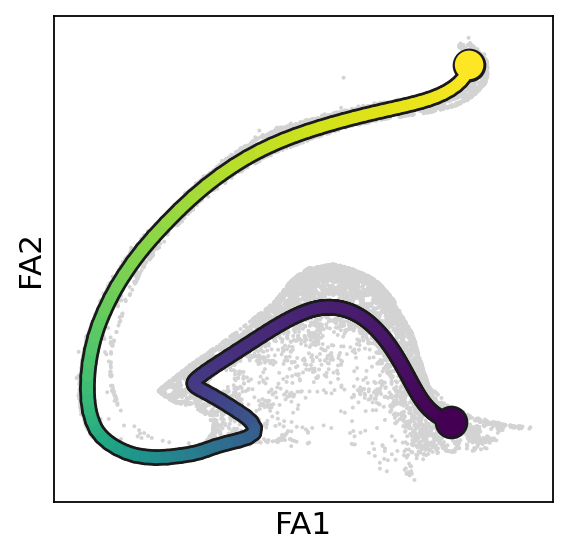

In [319]:
scf.pl.trajectory(adatasubset)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


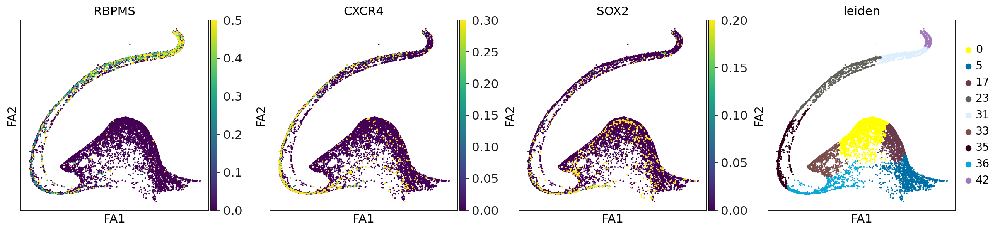

In [62]:
sc.pl.draw_graph(adatasubset,color=["RBPMS",'CXCR4', 'SOX2', 'leiden'], vmax = [0.5, 0.3,0.2])

In [94]:
old_to_new = {
'42':'Maturation',
'31':'Maturation'}
adatasubset.obs['clusters'] = (
adatasubset.obs['leiden']
.map(old_to_new).astype('category')
)

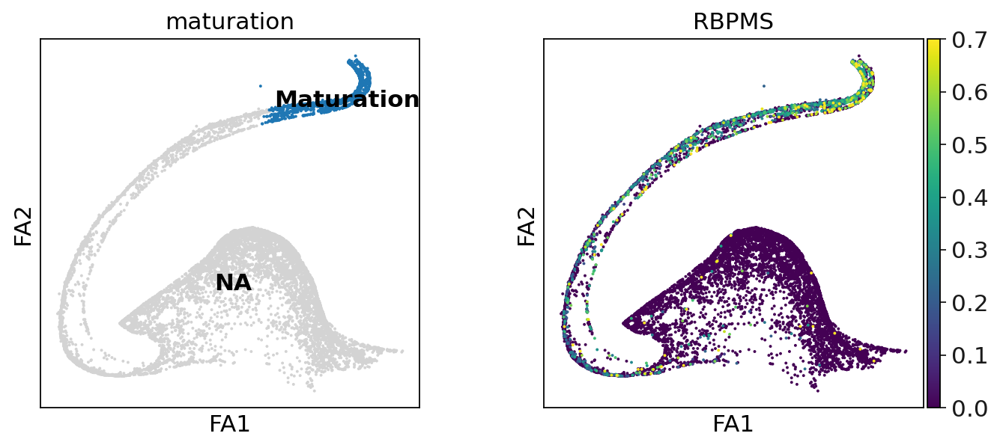

In [64]:
sc.pl.draw_graph(adatasubset,color=["maturation",'RBPMS'], vmax = 0.7, legend_loc = 'on data')

In [93]:
old_to_new = {
'42':'Maturation',
'31':'Maturation',    
'23':'Migration',
'35':'Migration',
'36':'Migration'}
adatasubset.obs['clusters'] = (
adatasubset.obs['leiden']
.map(old_to_new).astype('category')
)

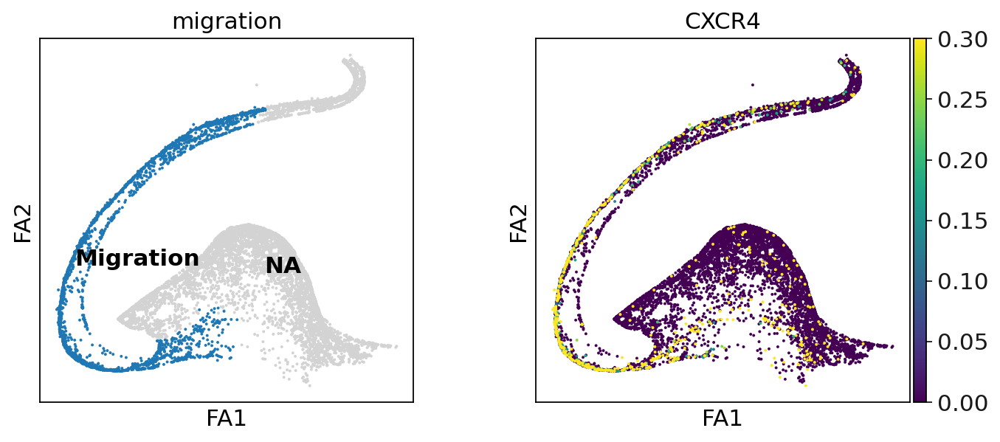

In [66]:
sc.pl.draw_graph(adatasubset,color=["migration",'CXCR4'], vmax = 0.3, legend_loc = 'on data')

In [96]:
old_to_new = {
'42':'Maturation',
'31':'Maturation',    
'23':'Migration',
'35':'Migration',
'36':'Migration',
'0':'Progenitors',
'5':'Progenitors',
'33':'Progenitors',
'17':'Progenitors'}
adatasubset.obs['clusters'] = (
adatasubset.obs['leiden']
.map(old_to_new).astype('category')
)

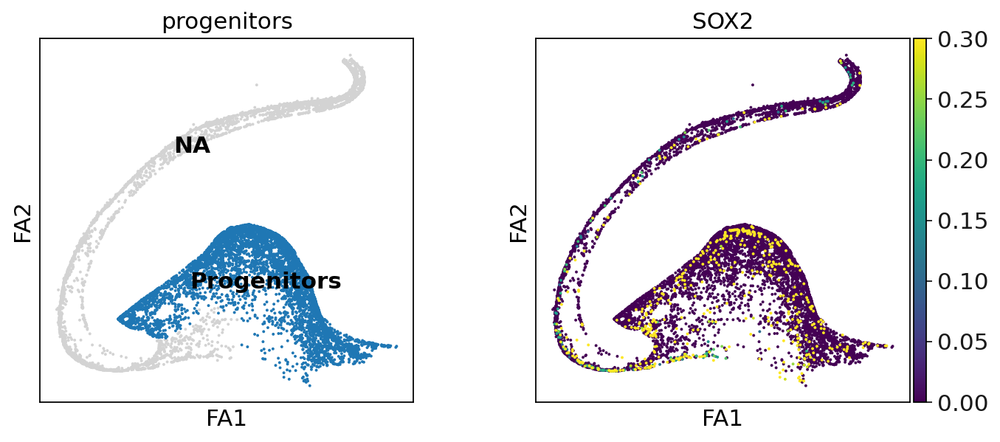

In [68]:
sc.pl.draw_graph(adatasubset,color=["progenitors",'SOX2'], vmax = [0.3], legend_loc = 'on data')

In [69]:
progenitors = adatasubset[adatasubset.obs['progenitors'].isin(['Progenitors'])]

In [98]:
adatasubset.obs

,stage,batch,leiden,maturation,migration,progenitors,clusters
AAACATACTTTCAC-1-0,FD59,0,36,NaN,Migration,NaN,Migration
AAACATTGACCTGA-1-0,FD59,0,35,NaN,Migration,NaN,Migration
AAACCGTGATACCG-1-0,FD59,0,0,NaN,NaN,Progenitors,Progenitors
AAACGCACCCGTAA-1-0,FD59,0,23,NaN,Migration,NaN,Migration
AAACGCACGAGGAC-1-0,FD59,0,31,Maturation,NaN,NaN,Maturation
...,...,...,...,...,...,...,...
TTTAGGCTTAACCG-1-4,FD82,4,36,NaN,Migration,NaN,Migration
TTTAGGCTTGCCTC-1-4,FD82,4,5,NaN,NaN,Progenitors,Progenitors
TTTAGGCTTTGACG-1-4,FD82,4,17,NaN,NaN,Progenitors,Progenitors
TTTATCCTTGCTCC-1-4,FD82,4,33,NaN,NaN,Progenitors,Progenitors


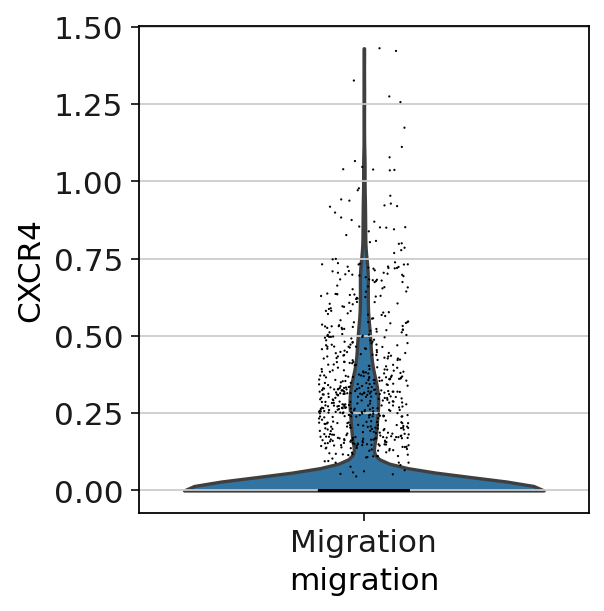

In [103]:
sc.pl.violin(adatasubset, 'CXCR4', groupby='migration')

In [107]:
gene_name = 'CXCR4'


# Calculate the average gene expression for each cluster
avg_expression_dict = {}

for cluster_label in adatasubset.obs['clusters'].unique():
    # Filter cells belonging to the current cluster
    cluster_cells = adatasubset.obs['clusters'] == cluster_label
    
    # Calculate the average expression for the gene in this cluster
    avg_expression_value = adatasubset[cluster_cells, gene_name].X.mean()
    
    # Store the result in the dictionary
    avg_expression_dict[cluster_label] = avg_expression_value

# Print the dictionary
print(avg_expression_dict)

{'Migration': 0.09382217, 'Progenitors': 0.013817597, 'Maturation': 0.009703747}


In [111]:
expression_threshold = 0  # You can adjust this threshold as needed

percentage_expression_dict = {}

for cluster_label in adatasubset.obs['clusters'].unique():
    # Filter cells belonging to the current cluster
    cluster_cells = adatasubset.obs['clusters'] == cluster_label
    
    # Subset the AnnData object to only include cells in the current cluster
    cluster_data = adatasubset[cluster_cells]
    
    # Count the number of cells expressing the gene above the threshold in this cluster
    num_expressing_cells = (cluster_data[:, gene_name].X > expression_threshold).sum()
    
    # Calculate the total number of cells in the cluster
    total_cells_in_cluster = len(cluster_data)
    
    # Calculate the percentage of cells expressing the gene in this cluster
    percentage_expression = (num_expressing_cells / total_cells_in_cluster) * 100
    
    # Store the result in the dictionary
    percentage_expression_dict[cluster_label] = percentage_expression

# Print the dictionary
print(percentage_expression_dict)

{'Migration': 24.19100236779795, 'Progenitors': 2.2082018927444795, 'Maturation': 3.1161473087818696}


In [109]:
percentage_expression_dict

{'Migration': <1x1 sparse matrix of type '<class 'numpy.float64'>'
 	with 1 stored elements in Compressed Sparse Row format>,
 'Progenitors': <1x1 sparse matrix of type '<class 'numpy.float64'>'
 	with 1 stored elements in Compressed Sparse Row format>,
 'Maturation': <1x1 sparse matrix of type '<class 'numpy.float64'>'
 	with 1 stored elements in Compressed Sparse Row format>}

In [71]:
from statistics import mean 

In [86]:
sc.tl.score_genes(progenitors, gene_list = ['CXCR4'], score_name = 'CXCR41', ctrl_size = 1)

computing score 'CXCR41'
    finished: added
    'CXCR41', score of gene set (adata.obs).
    1 total control genes are used. (0:00:00)


In [87]:
mean(progenitors.obs['CXCR4'])

-0.001617675466763944

In [359]:
mean(progenitors.obs['Jon_pos_reg1'])

0.0032422527102102415

In [360]:
mean(progenitors.obs['Jon_pos_reg2'])

0.011849833645306907

In [361]:
mean(progenitors.obs['Jon_negative'])

-0.004266638422258024

In [81]:
migration = adatasubset[adatasubset.obs['migration'].isin(['Migration'])]

In [363]:
mean(migration.obs['Jon_positive'])

-0.005096917422717381

In [364]:
mean(migration.obs['Jon_pos_reg1'])

0.002332057735604447

In [365]:
mean(migration.obs['Jon_pos_reg2'])

0.012673410245328094

In [366]:
mean(migration.obs['Jon_negative'])

-0.000954766522446738

In [367]:
maturation = adatasubset[adatasubset.obs['maturation'].isin(['Maturation'])]

In [368]:
mean(maturation.obs['Jon_positive'])

-0.008971455110331357

In [369]:
mean(maturation.obs['Jon_pos_reg1'])

-0.0017166369209154892

In [370]:
mean(maturation.obs['Jon_pos_reg2'])

0.005119431859032297

In [371]:
mean(maturation.obs['Jon_negative'])

0.00024002144993707703

In [372]:
old_to_new = {
'42':'Maturation',
'31':'Maturation',
'0':'Progenitors',
'5':'Progenitors',
'33':'Progenitors',
'17':'Progenitors',
'23':'Migration',
'35':'Migration',
'36':'Migration'
}
adatasubset.obs['annotation'] = (
adatasubset.obs['leiden']
.map(old_to_new).astype('category')
)

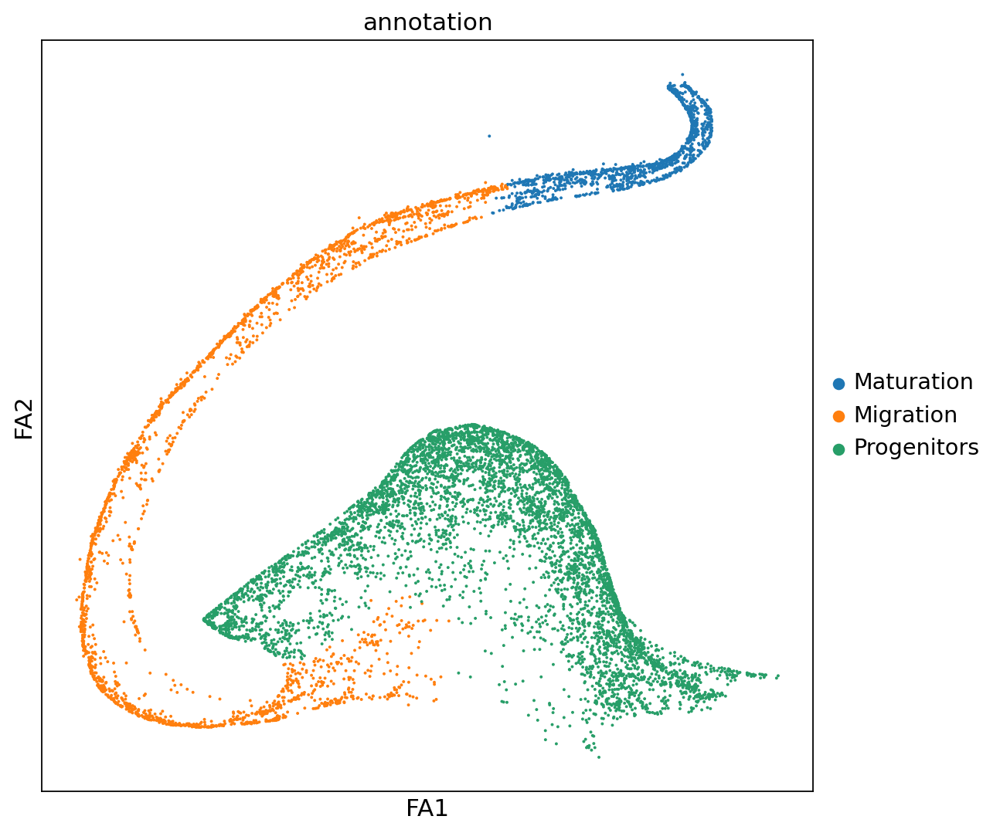

In [397]:
sc.set_figure_params(figsize = [8,8])
sc.pl.draw_graph(adatasubset,color=["annotation",])

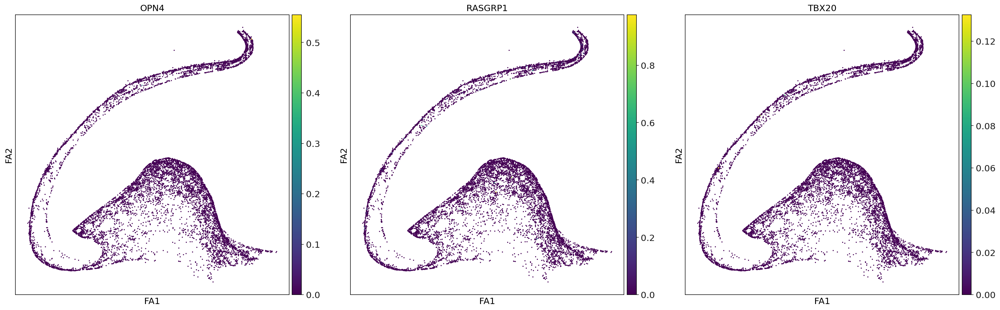

In [401]:
sc.pl.draw_graph(adatasubset,color=['OPN4','RASGRP1','TBX20'])